In [91]:
%pylab inline
from utils import wav2audio_segment, audiofigure, Descriptor, audiofigure, normalize
import pandas as pd
from sklearn import decomposition
import librosa
from  librosa.util import frame
import scipy
import IPython
from IPython.display import display, Audio
from sklearn.cluster import KMeans,DBSCAN, estimate_bandwidth, MeanShift

def framesoverlap(frames,hop,win_lenght,window=None):
    
    if not window:
        window = scipy.signal.hanning(win_lenght,sym=False)

    ntotal = (frames.shape[1]-1)*hop + win_lenght
        
    outsignal = np.zeros(ntotal)

    k=-1
    npos = 0
    while npos<ntotal:
        if (ntotal-npos)>win_lenght:
            k+=1
            outsignal[npos:npos+win_lenght] += frames[:,k]*window
            npos += hop

        else:
            break
            
    return outsignal

Populating the interactive namespace from numpy and matplotlib


In [160]:
path = "../wavs/"
fnames = ["Grisey_partiels.wav"]
T1 = 1
T2 = 120
# fnames = ["Stockhausen_Kontakte.wav"]
# T1 = 40
# T2 = 52
# fnames = ["BeachBoys_SurfinUSA.wav"]
# T1 = 1
# T2 = 20

In [161]:
n_mfcc = 20
NFFT = 2**14
HOP = int(NFFT/4)
WIN_LENGTH = NFFT
sr = 44100


In [162]:
DESCRIPTORS = [

{'name': 'mfcc',
 'params': {'n_mfcc':n_mfcc,'sr':sr},
 'function': lambda self,y: librosa.feature.mfcc(S=Sm, **self.params).T },

{'name': 'rmse',
 'params': {},
 'function': lambda self,y: librosa.feature.rmse(S=Sm).T },

{'name': 'rolloff',
 'params': {'sr':sr},
 'function': lambda self,y: librosa.feature.spectral_rolloff(S=Sm,sr=sr).T },
    
{'name': 'centroid',
 'params': {'sr':sr},
 'function': lambda self,y: librosa.feature.spectral_centroid(S=Sm,**self.params).T },
    
{'name': 'scontrast',
 'params': {'sr':sr} ,
 'function' : lambda self,y: librosa.feature.spectral_contrast(S=Sm, **self.params).T },

{'name': 'chroma',
 'params':{} ,
 'function': lambda self, y: librosa.feature.chroma_stft(S=Sm, **self.params).T }]

In [163]:
audio = {}
df = pd.DataFrame()

for fname in fnames:
    sr, signal  = wav2audio_segment(path+fname,T1,T2)

    S = librosa.stft(signal,n_fft=NFFT, hop_length=HOP,center=False)
    Sm = abs(S)
    
    ntotal = signal.size
    durtotal = ntotal/sr
    
    normdata = []
    data = []
    multiindex = []
    
    for D in DESCRIPTORS:
        d = Descriptor(D)
        d.perform(signal)
        data.append(d.data)
        ndata = normalize(d.data)
        normdata.append(ndata)        
            
        multiindex += [ (d.name,i) for i in range(d.data.shape[1]) ]
    

In [164]:
frames = frame(signal, frame_length=NFFT, hop_length=HOP)
normframes = frames/sqrt((frames**2).mean(0))

In [165]:
columns = pd.MultiIndex.from_tuples(multiindex, names=['Descriptor', 'Feature'])
df = pd.DataFrame(np.hstack(data),columns = columns)
normdf = pd.DataFrame(np.hstack(normdata),columns = columns)

In [166]:
pca = decomposition.PCA(n_components=40)
Ypca = pca.fit_transform(normdf.values)

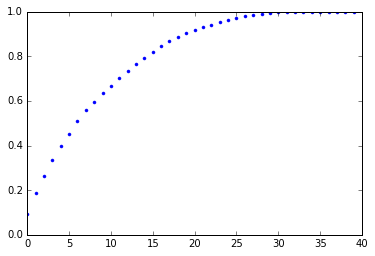

In [167]:
plot(cumsum(pca.explained_variance_ratio_),'.')
maxpca= where(cumsum(pca.explained_variance_ratio_)>0.9)[0][0]

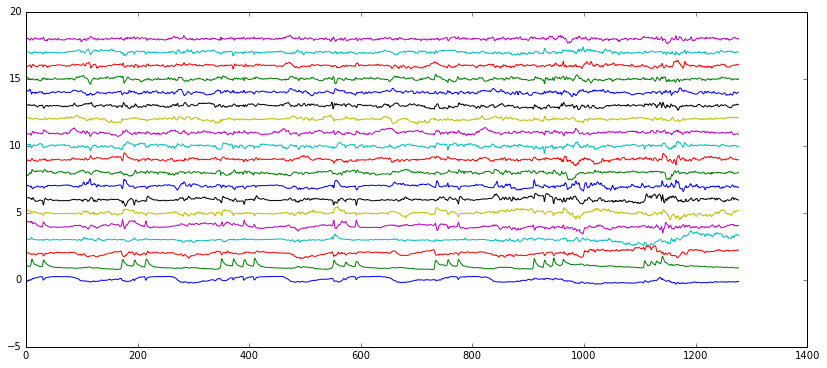

In [168]:
figure(figsize=(14,6))
Ypca = Ypca[:,:maxpca]
plot(Ypca+arange(maxpca));

/usr/local/lib/python2.7/dist-packages/ipykernel/__main__.py:2: FutureWarning: 
The default value for 'return_type' will change to 'axes' in a future release.
 To use the future behavior now, set return_type='axes'.
 To keep the previous behavior and silence this warning, set return_type='dict'.
  from ipykernel import kernelapp as app


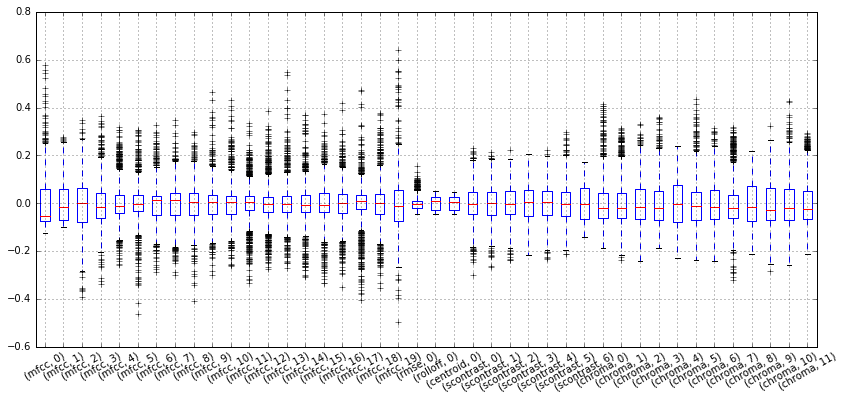

In [169]:
figure(figsize=(14,6))
normdf.boxplot();
labels = gca().get_xticklabels()
plt.setp(labels, rotation=30, fontsize=10);

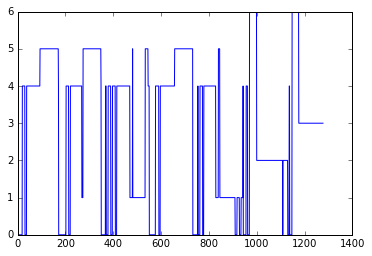

In [170]:
X = normdf.values
n_clusters=7
labels = KMeans(n_clusters=n_clusters, random_state=170).fit_predict(X)
plot(labels)
for i in range(n_clusters):
    outsignal = framesoverlap(frames[:,labels==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))

In [171]:
for eps in linspace(0.01,0.5,100):
    db = DBSCAN(eps=eps, min_samples=4).fit(Ypca)
    print(eps,np.unique(db.labels_),sum(db.labels_==-1))

(0.01, array([-1]), 1278)
(0.014949494949494949, array([-1]), 1278)
(0.019898989898989899, array([-1]), 1278)
(0.024848484848484849, array([-1]), 1278)
(0.029797979797979796, array([-1]), 1278)
(0.034747474747474749, array([-1]), 1278)
(0.039696969696969696, array([-1]), 1278)
(0.044646464646464649, array([-1]), 1278)
(0.049595959595959596, array([-1]), 1278)
(0.054545454545454543, array([-1]), 1278)
(0.059494949494949496, array([-1]), 1278)
(0.064444444444444443, array([-1]), 1278)
(0.069393939393939383, array([-1,  0]), 1274)
(0.074343434343434336, array([-1,  0,  1]), 1269)
(0.07929292929292929, array([-1,  0,  1,  2]), 1260)
(0.08424242424242423, array([-1,  0,  1,  2,  3,  4]), 1252)
(0.089191919191919183, array([-1,  0,  1,  2,  3,  4,  5,  6]), 1238)
(0.094141414141414137, array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]), 1213)
(0.099090909090909077, array([-1,  0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]), 1194)
(0.10404040404040403, array([-1,  0,  1,  2,

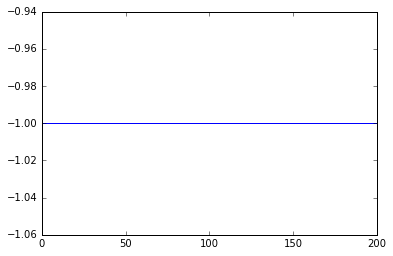

In [126]:
db = DBSCAN(eps=0.410, min_samples=8).fit(Ypca)
plot(db.labels_)
for i in np.unique(db.labels_):
    outsignal = framesoverlap(frames[:,db.labels_==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))

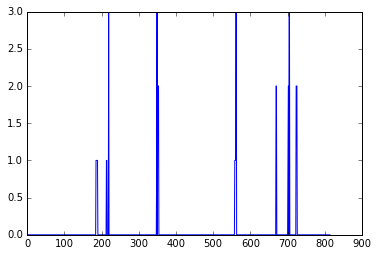

In [97]:
X = Ypca
bandwidth = estimate_bandwidth(X, quantile=0.5, n_samples=500)
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True)
ms.fit(X)
labels = ms.labels_
plot(labels)
for i in np.unique(labels):
    outsignal = framesoverlap(frames[:,labels==i],HOP, WIN_LENGTH )
    display(Audio(data=outsignal,rate=sr))